# Grid Plots of Fold Change Comparisons by Tissue

**Goal:** Show GTEx is a better fit to its counterpart tissue in TCGA than a random GTEx tissue given sufficient sample size.

**Method:** Using DESeq2 normalized expression counts, estimate log2 fold change (l2fc) between GTEx and (TCGA) Tumor and compare to the l2fc between TCGA Normal and Tumor by plotting concordance and estimating pearson correlation. Repeat for all GTEx tissues to produce a grid, then repeat for all tissues.

**Algorithm**

- for $t_1 \in \mathcal{T}$
    - compute l2fc Normal vs. Tumor for $t_1$
    - for $t_2 \in \mathcal{T}$
        - Compute l2fc GTEx ($t_2$) vs. Tumor ($t_1$)
        - Compute Pearson Correlation
        - Plot regplot
        - Save gridplot


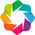

In [84]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats.stats import pearsonr
import seaborn as sns
sns.set_style('whitegrid')

from collections import defaultdict

from rnaseq_lib.utils import mkdir_p
from rnaseq_lib.de import get_l2fc
from rnaseq_lib.utils.tissues import return_samples


import holoviews as hv
hv.extension('bokeh')

## Prepare Input Data
Requires `rnaseq_lib` which you can install with `pip install rnaseq_lib`

Create output directories

In [33]:
mkdir_p('grid-plots')
mkdir_p('figs')
mkdir_p('pickles')

Collect tissues

In [10]:
samples = return_samples()

Determine which tissues have TCGA normal samples for comparison

In [63]:
normal_tissues = sorted([x for x in samples if any([y for y in samples[x] if y.endswith('11')])])

In [12]:
print 'These tissues have no TCGA normal: {}'.format(', '.join(set(samples).difference(set(normal_tissues))))

These tissues have no TCGA normal: Testis, Ovary


Read in DESeq2 normalized expression matrix

In [14]:
df_path = '/mnt/rna-seq-analysis/data/xena/deseq2_normalized_tcga_gtex_counts.tsv'
df = pd.read_csv(df_path, sep='\t', index_col=0)

## Gridplots of TCGA Tumor vs Normal Compared to All GTEx Tissues vs. Tumor

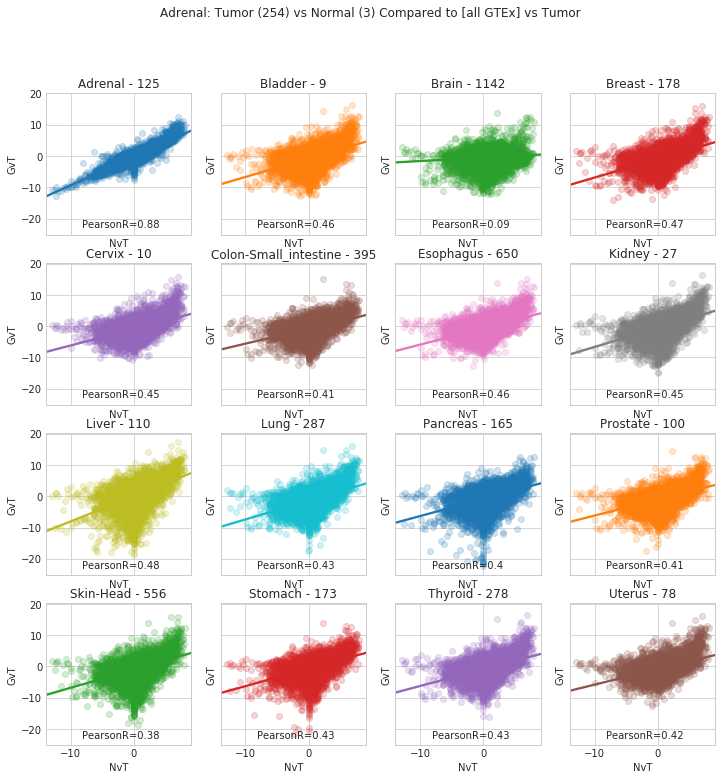

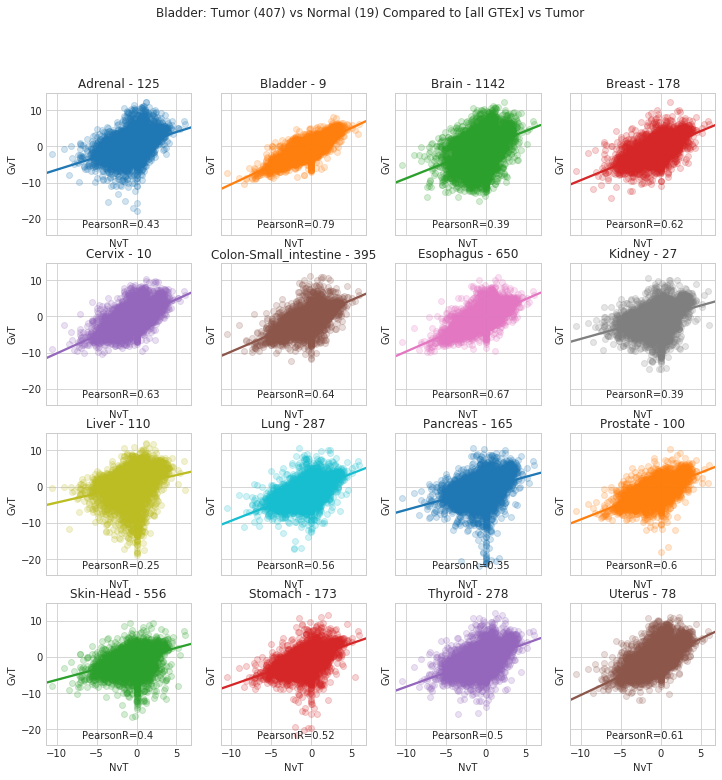

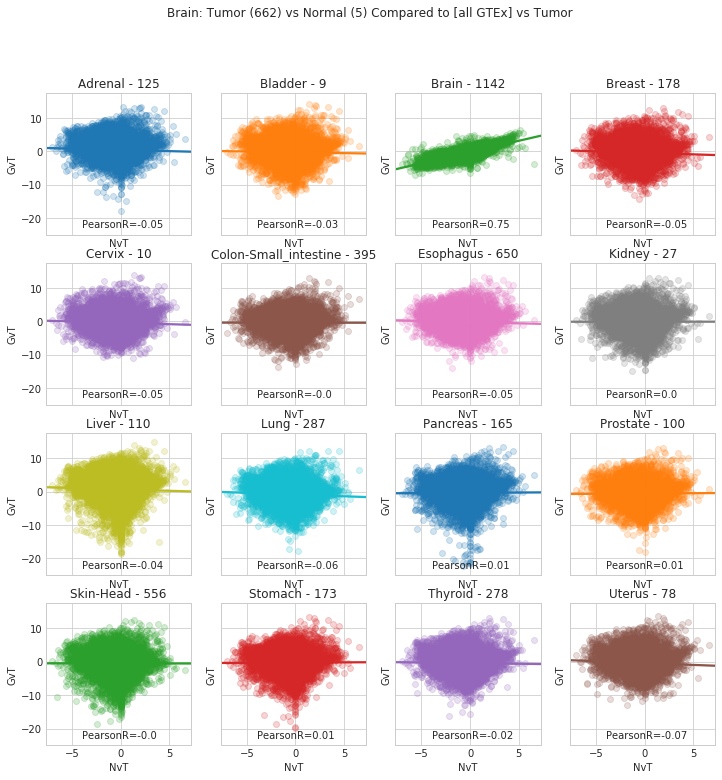

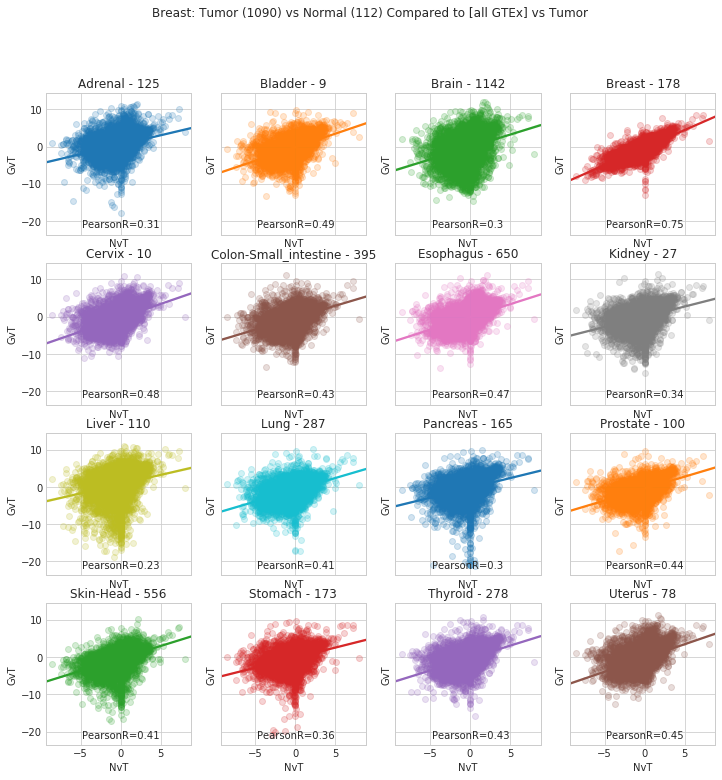

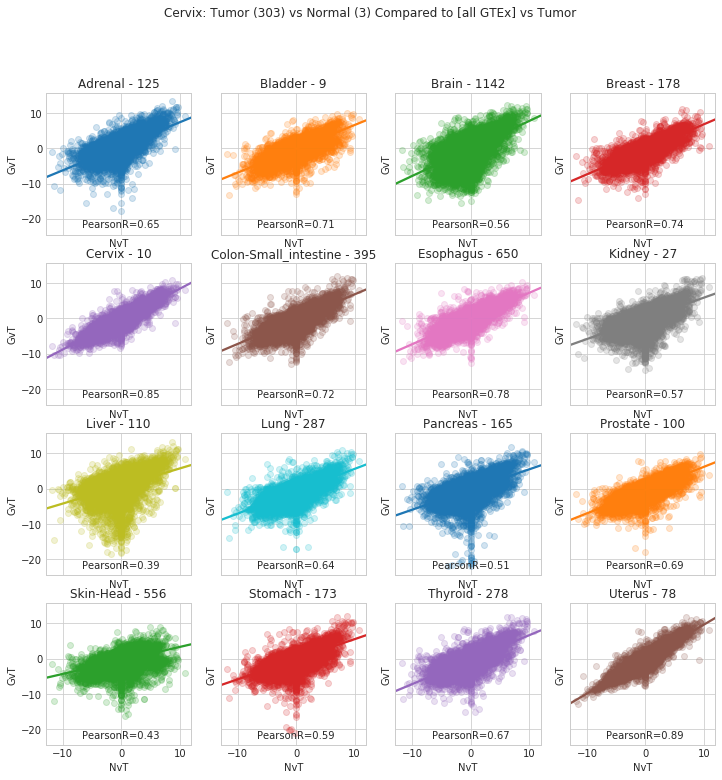

...

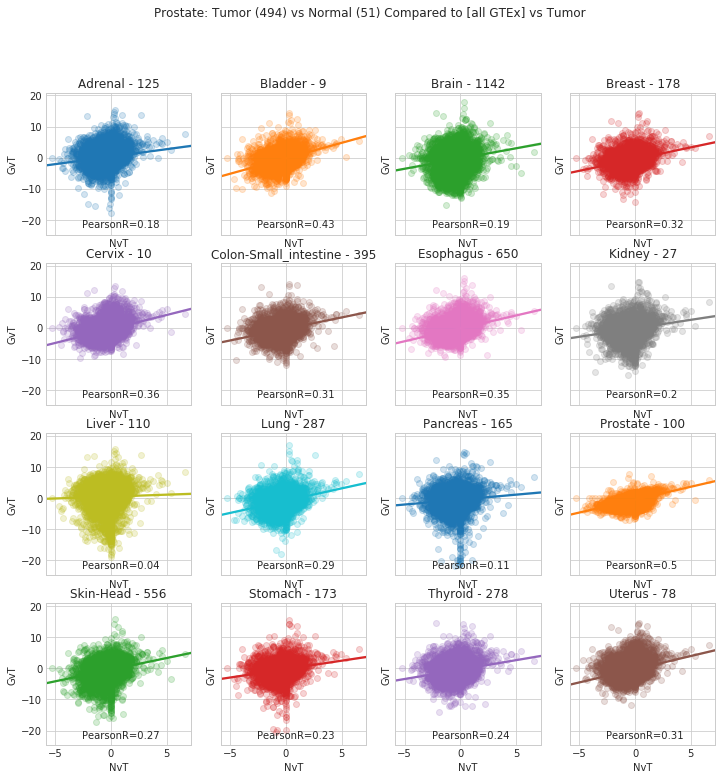

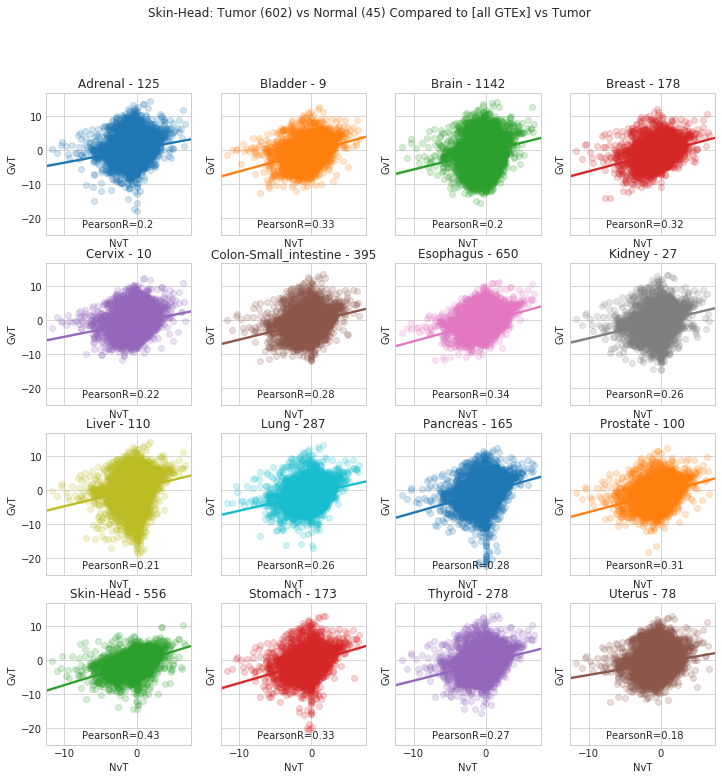

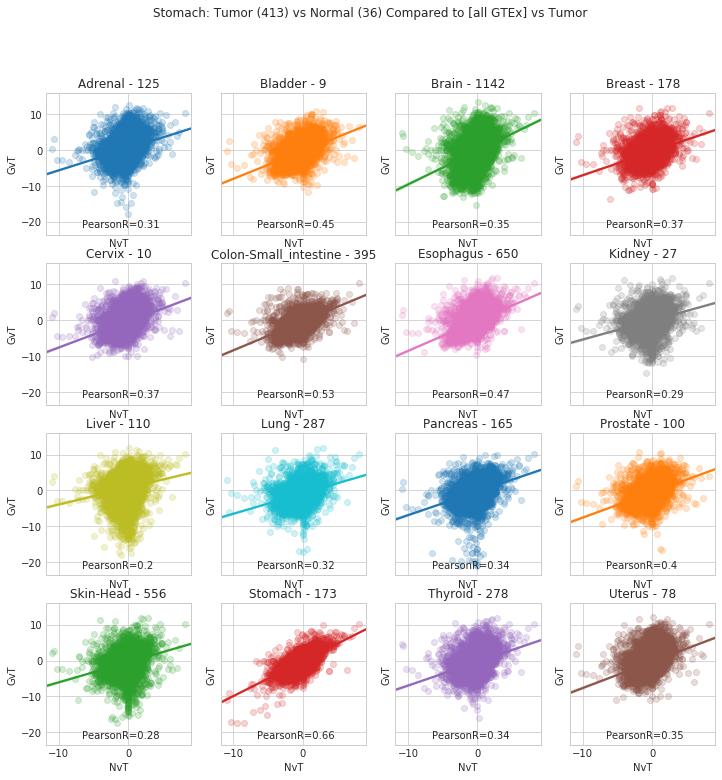

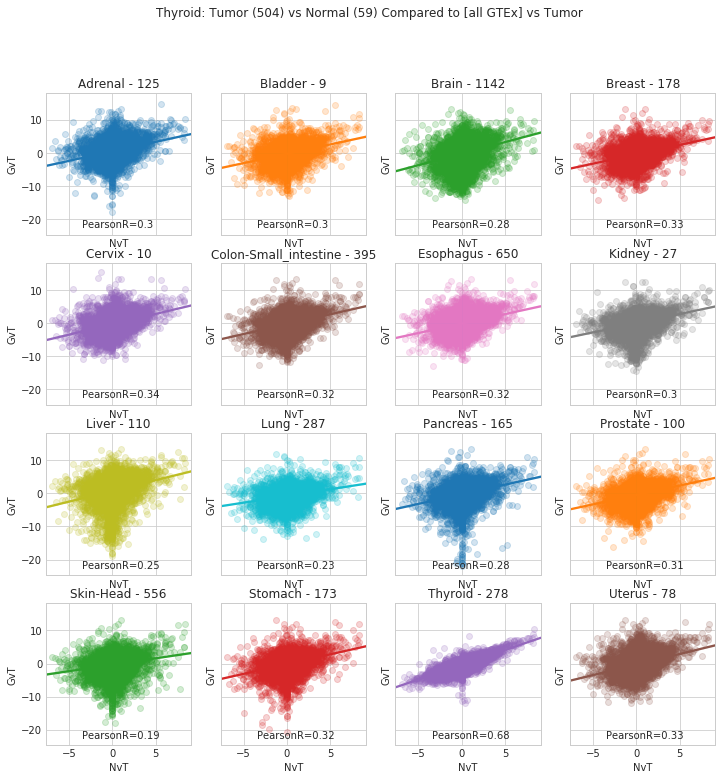

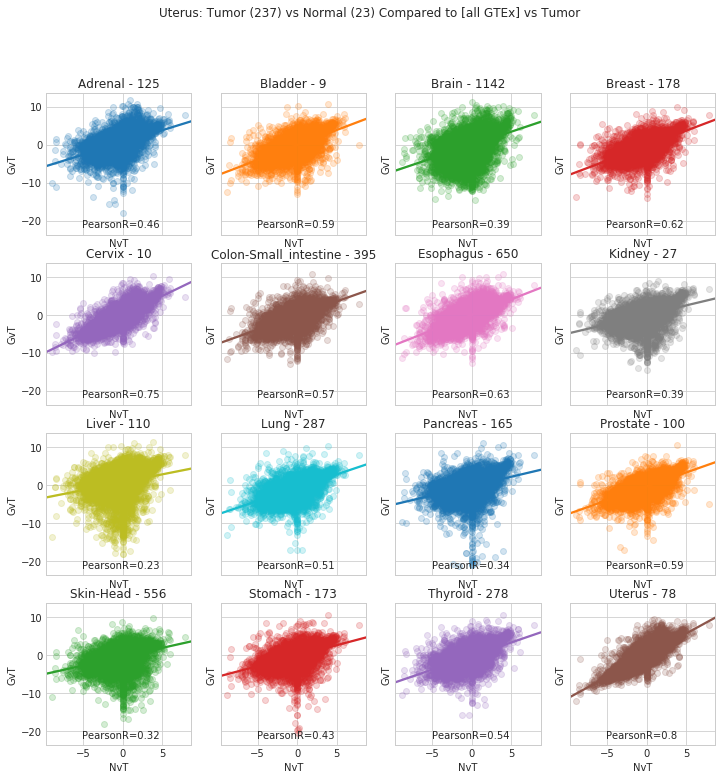

In [52]:
# Store scores in a dict of dict. tissue -> dict[tissue] = score
# Store counts in a dict of dict. dataset -> dict[tissue] = count
scores = defaultdict(dict)
counts = defaultdict(dict)
for tissue in normal_tissues:
    # Select GTEx, Tumor, and Normal samples
    t = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('01')]))
    n = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('11')]))
    counts[tissue]['n'] = len(n)
    counts[tissue]['t'] = len(t)
    counts[tissue]['g'] = dict()
    
    # Compute l2fc for normal vs. tumor
    t_med = df[t].median(axis=1)
    n_med = df[n].median(axis=1)
    nt_l2fc = get_l2fc(n_med, t_med)
    
    # Define plotting information for this tissue
    f, ax = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(12, 12))
    ax = ax.flatten()
    plt.suptitle('{}: Tumor ({}) vs Normal ({}) Compared to [all GTEx] vs Tumor'.format(tissue, len(t), len(n)))
    for i, tissue2 in enumerate(normal_tissues):
        # Compute l2fc between tissue2 GTEx and Tumor
        g = list(set([x for x in samples[tissue2] if not x.startswith('TCGA')]))
        g_med = df[g].median(axis=1)
        gt_l2fc = get_l2fc(g_med, t_med)
        pr = round(pearsonr(nt_l2fc, gt_l2fc)[0], 2)
        
        # Record information
        scores[tissue][tissue2] = pr
        counts[tissue]['g'][tissue2] = len(g) 
        
        # Plot
        sns.regplot(x=nt_l2fc, y=gt_l2fc, scatter_kws={'alpha': 0.2}, ax=ax[i])
        ax[i].set_xlabel('NvT')
        ax[i].set_ylabel('GvT')
        ax[i].set_title('{} - {}'.format(tissue2, len(g)))
        ax[i].text(0.25, 0.05, 'PearsonR={}'.format(pr), transform=ax[i].transAxes)
    plt.savefig('grid-plots/{}.png'.format(tissue), format='png', dpi=300)

## Shrink Griplots to Single Scatter Plot

In [53]:
# Collect information to create dataframe
source, target, rscores = [], [], []
t, n, g = [], [], []
for tissue in sorted(scores):
    source.extend([tissue for _ in scores[tissue]])
    target.extend(sorted(scores[tissue].keys()))
    rscores.extend([scores[tissue][x] for x in sorted(scores[tissue].keys())])
    t.extend([counts[tissue]['t'] for _ in sorted(counts[tissue]['g'])])
    n.extend([counts[tissue]['n'] for _ in sorted(counts[tissue]['g'])])
    g.extend([counts[tissue]['g'][x] for x in sorted(counts[tissue]['g'])])

# Build annotated Dataframe
plot = pd.DataFrame()
plot['Tissue'] = source
plot['Target'] = target
plot['Scores'] = rscores
plot['# Tumors'] = t
plot['# Normals'] = n
plot['# GTEx'] = g
plot.to_pickle('pickles/FoldChange-Scatter.panda')

# Make scatter object
shrink = hv.Scatter(plot, kdims=['Tissue'], 
                    vdims=['Scores', 'Target', '# Tumors', '# Normals', '# GTEx'],
                    extents=(None, 0, None, 1.0),
                    group='PearsonR Scores of Gene Expression Fold Change Between Tumor/Normal and Tumor/GTEx')

In [54]:
%%opts Scatter [width=900 height=450 tools=['hover']]
%%opts Scatter [color_index='Target' xrotation=45]
%%opts Scatter (cmap='tab20' size=7)
%%opts Scatter [legend_position='left' show_legend=True]
%%output filename="figs/FoldChange-Scatter" fig="auto"
shrink

:Scatter   [Tissue]   (Scores,Target,# Tumors,# Normals,# GTEx)

### Discussion

This comparison provides a basis for including or excluding tissues when doing comparative analysis of GTEx and TCGA tissues. As a rough start, we can break the tissues into a few groups, where _similar_ implies high pearson correlation for the same tissue type and _distinct_ implies it is unsimilar from every other tissue comparison.

**Similar and Distinct**
- Adrenal
- Bladder
- Brain
- Breast
- Kidney
- Liver
- Lung
- Thyroid

**Similar and Indistinct** <br> Cervix and Uterus are similar to each other
- Cervix
- Uterus

**Unsimilar and Distinct**
- Colon_small-intestine
    - R: 0.60
- Prostate
    - R: 0.50
- Skin-head
    - R: 0.43
- Stomach
    - R: 0.66
    
**Unsimilar and Indistinct**
- Pancreas



## Gridplots of TCGA Tumor vs Normal Compared to All Normals vs. Tumor

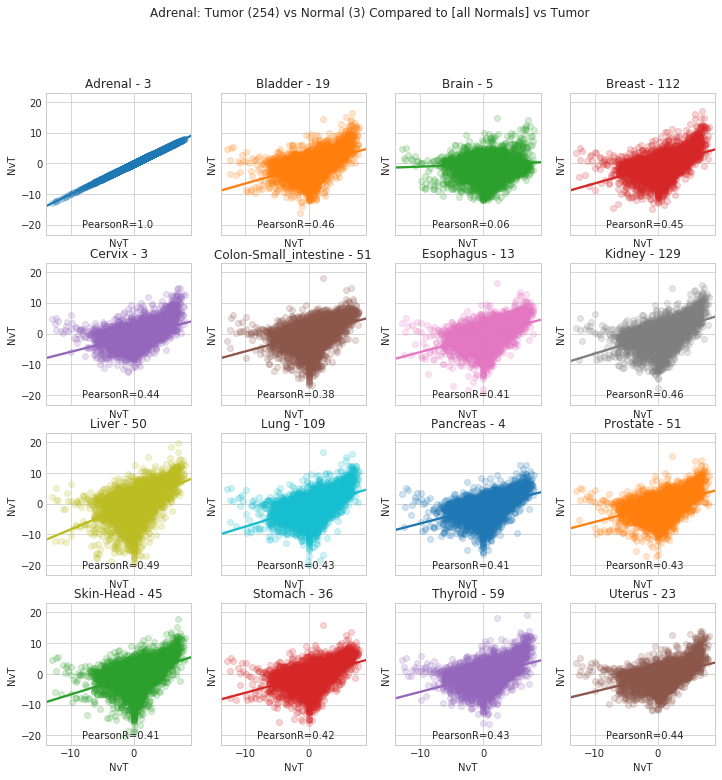

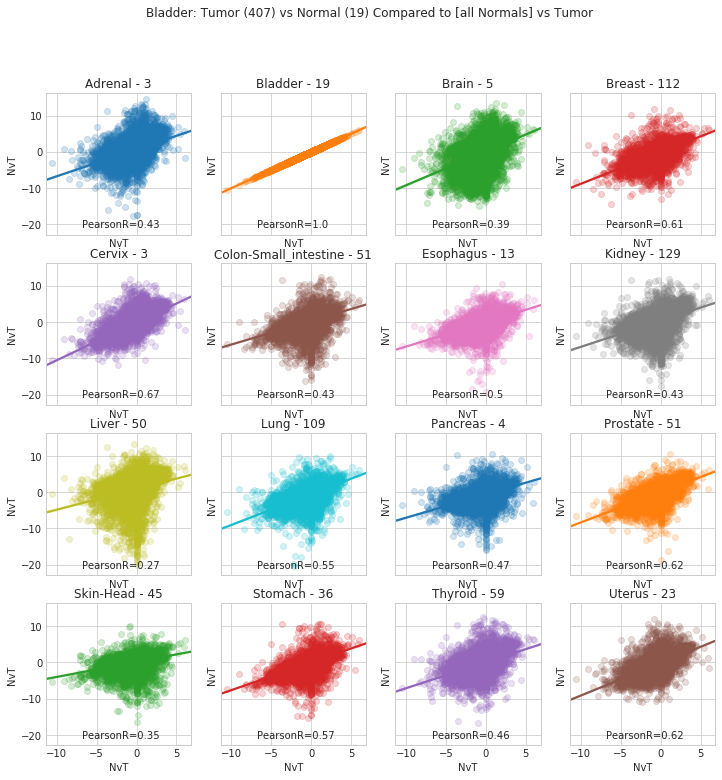

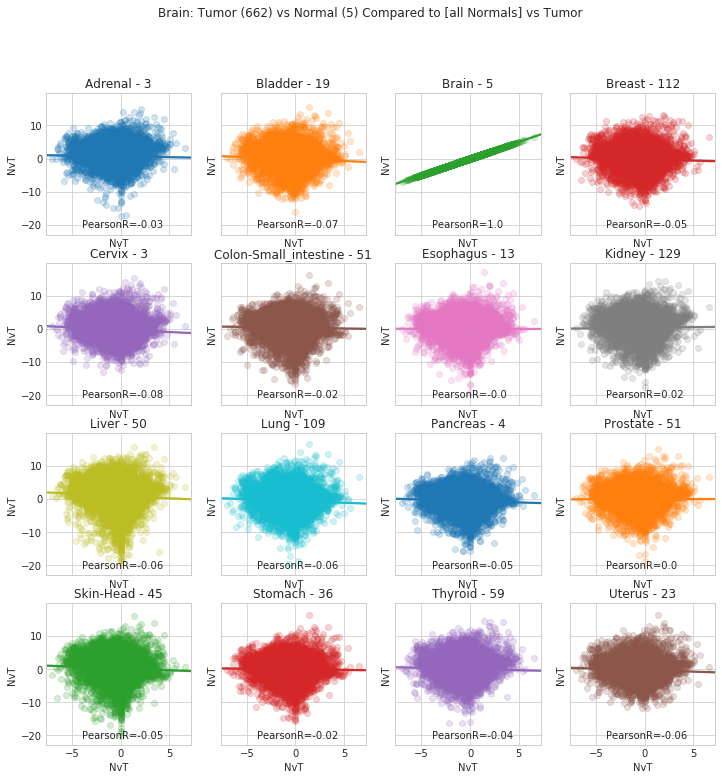

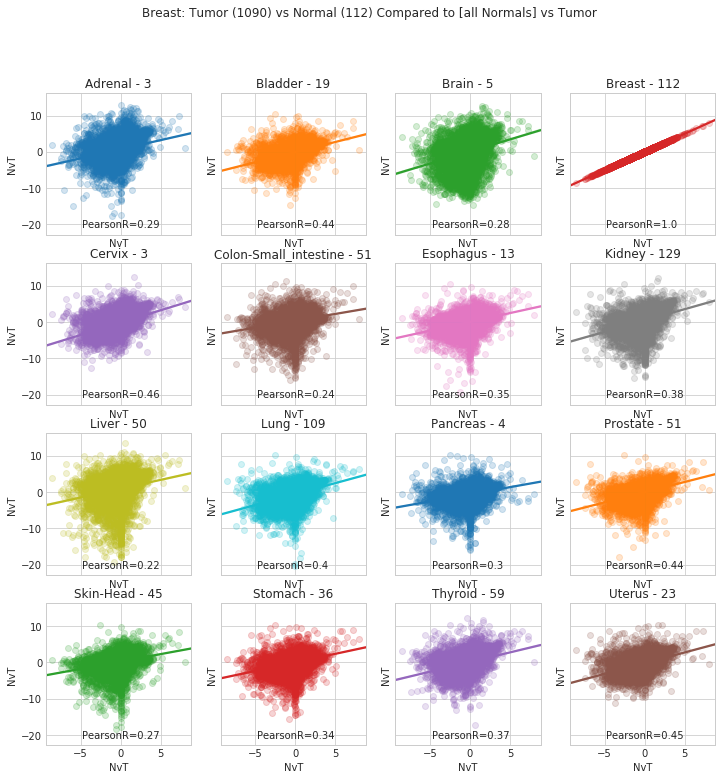

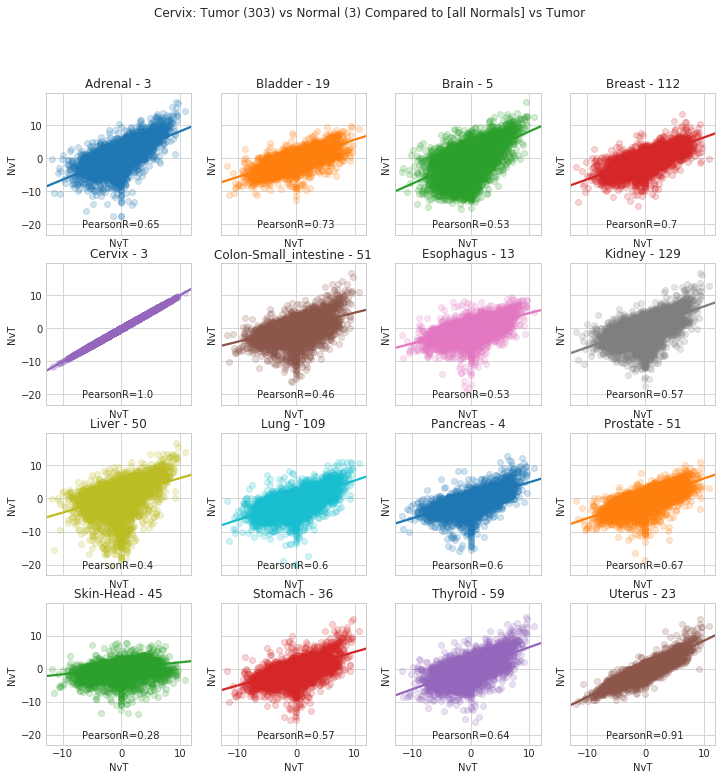

...

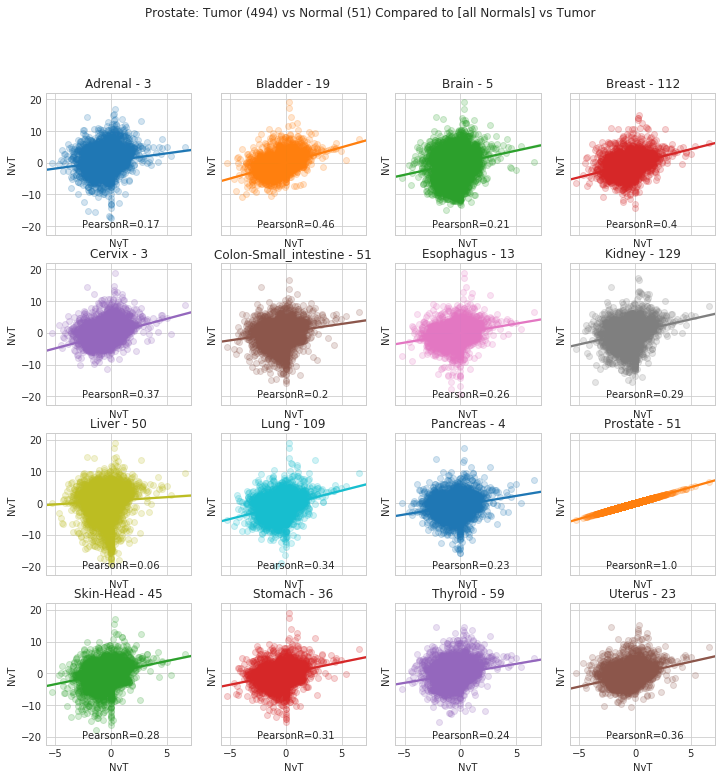

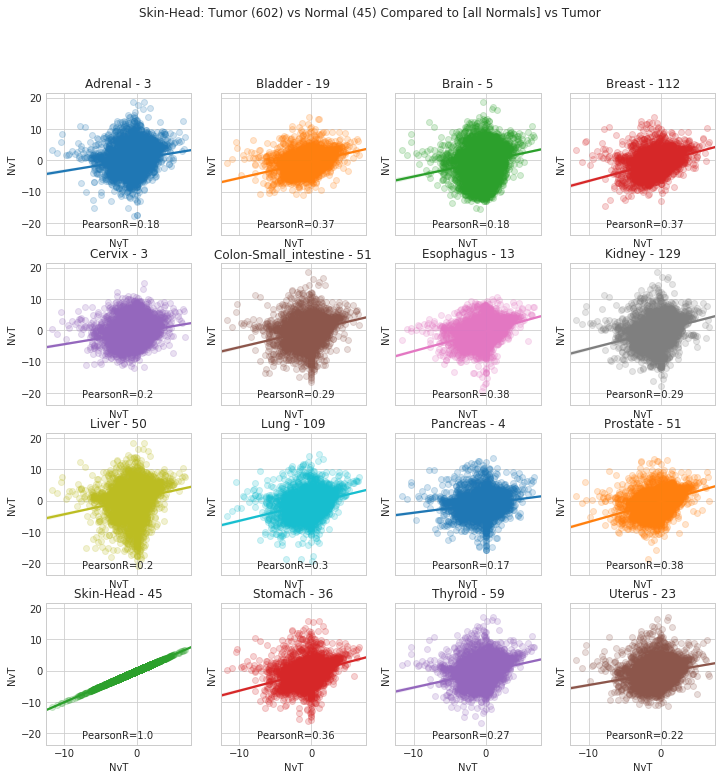

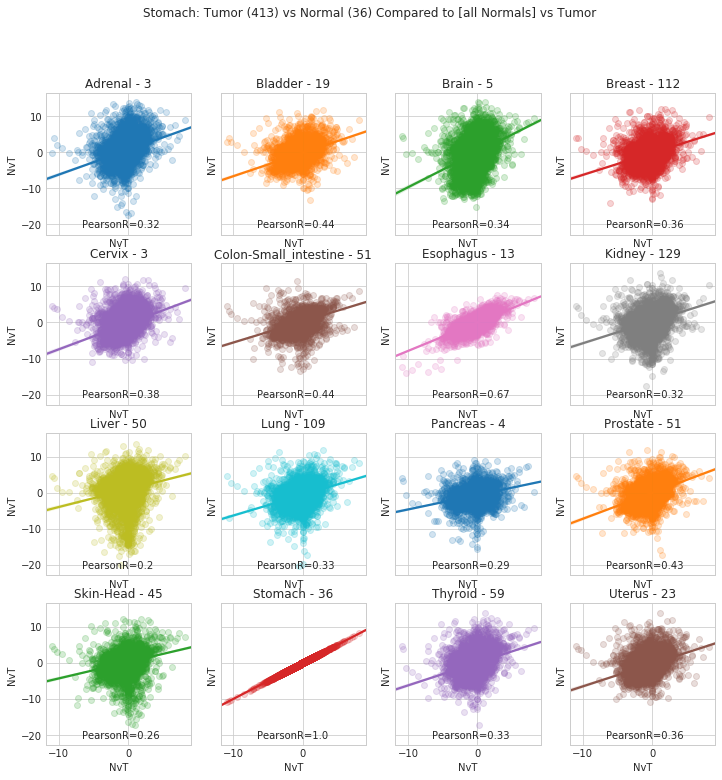

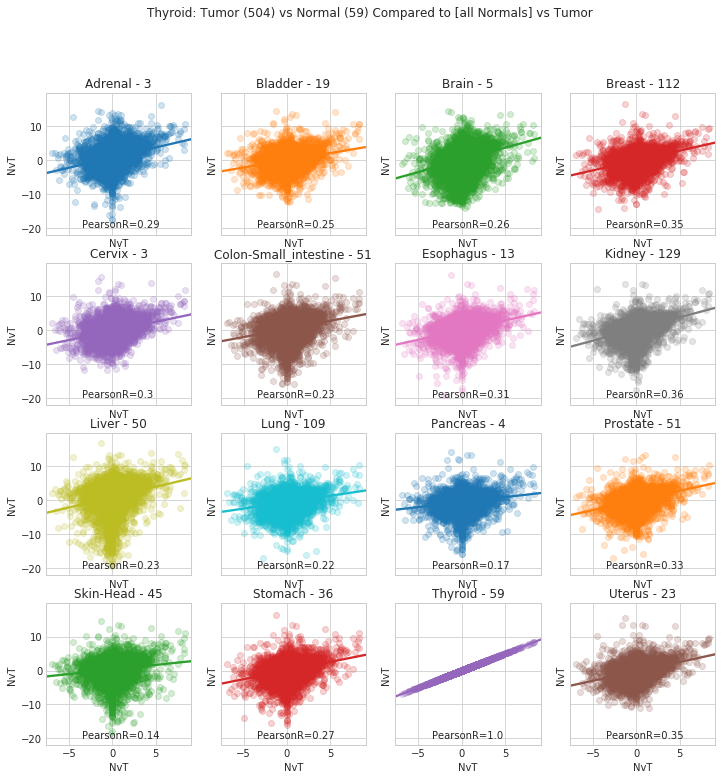

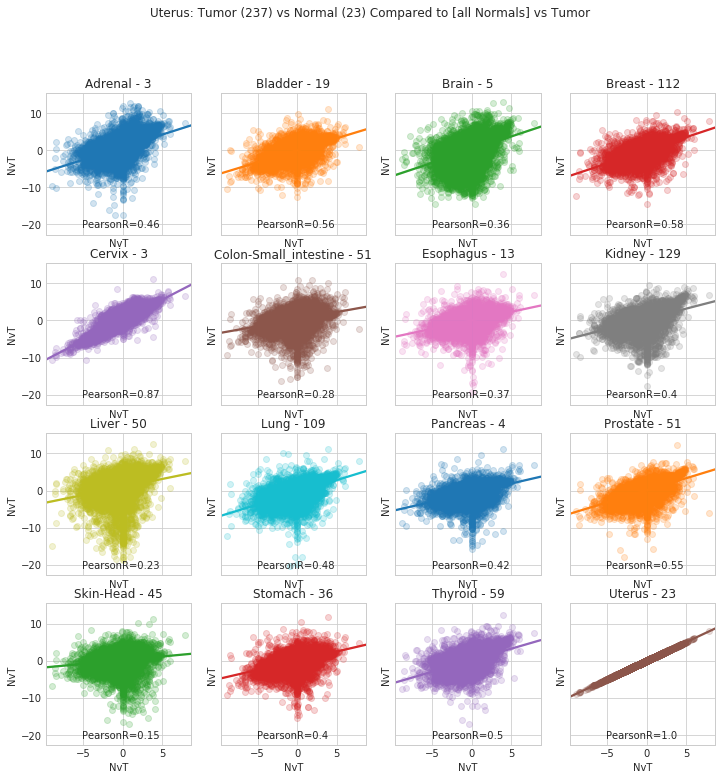

In [46]:
scores = defaultdict(dict)
counts = defaultdict(dict)
for tissue in normal_tissues:
    # Select GTEx, Tumor, and Normal samples
    t = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('01')]))
    n = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('11')]))
    counts[tissue]['n'] = len(n)
    counts[tissue]['t'] = len(t)
    counts[tissue]['g'] = dict()
    
    # Compute l2fc for normal vs. tumor
    t_med = df[t].median(axis=1)
    n_med = df[n].median(axis=1)
    nt_l2fc = get_l2fc(n_med, t_med)
    
    # Define plotting information for this tissue
    f, ax = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(12, 12))
    ax = ax.flatten()
    plt.suptitle('{}: Tumor ({}) vs Normal ({}) Compared to [all Normals] vs Tumor'.format(tissue, len(t), len(n)))
    for i, tissue2 in enumerate(normal_tissues):
        # Compute l2fc between tissue2 New Normal and Tumor
        g = list(set([x for x in samples[tissue2] if x.startswith('TCGA') and x.endswith('11')]))
        g_med = df[g].median(axis=1)
        gt_l2fc = get_l2fc(g_med, t_med)
        pr = round(pearsonr(nt_l2fc, gt_l2fc)[0], 2)
        
        # Record information
        scores[tissue][tissue2] = pr
        counts[tissue]['g'][tissue2] = len(g) 
        
        # Plot
        sns.regplot(x=nt_l2fc, y=gt_l2fc, scatter_kws={'alpha': 0.2}, ax=ax[i])
        ax[i].set_xlabel('NvT')
        ax[i].set_ylabel('NvT')
        ax[i].set_title('{} - {}'.format(tissue2, len(g)))
        ax[i].text(0.25, 0.05, 'PearsonR={}'.format(pr), transform=ax[i].transAxes)
    plt.savefig('grid-plots/{}-normal.png'.format(tissue), format='png', dpi=300)

In [48]:
# Collect information to create dataframe
source, target, rscores = [], [], []
t, n, g = [], [], []
for tissue in sorted(scores):
    source.extend([tissue for _ in scores[tissue]])
    target.extend(sorted(scores[tissue].keys()))
    rscores.extend([scores[tissue][x] for x in sorted(scores[tissue].keys())])
    t.extend([counts[tissue]['t'] for _ in sorted(counts[tissue]['g'])])
    n.extend([counts[tissue]['n'] for _ in sorted(counts[tissue]['g'])])
    g.extend([counts[tissue]['g'][x] for x in sorted(counts[tissue]['g'])])

# Build annotated Dataframe
plot = pd.DataFrame()
plot['Tissue'] = source
plot['Target'] = target
plot['Scores'] = rscores
plot['# Tumors'] = t
plot['# Normals'] = n
plot['# GTEx'] = g
plot.to_pickle('pickles/FoldChange-Scatter-Normal.panda')

# Make scatter object
shrink = hv.Scatter(plot, kdims=['Tissue'], 
                    vdims=['Scores', 'Target', '# Tumors', '# Normals', '# GTEx'],
                    extents=(None, 0, None, 1.0),
                    group='PearsonR Scores of Fold Change Between Tumor vs. Normal and Tumor vs. GTEx')

In [49]:
%%opts Scatter [width=900 height=450 tools=['hover']]
%%opts Scatter [color_index='Target' xrotation=45]
%%opts Scatter (cmap='tab20' size=7)
%%opts Scatter [legend_position='left' show_legend=True]
%%output filename="figs/FoldChange-Scatter-Normal" fig="auto"
shrink

:Scatter   [Tissue]   (Scores,Target,# Tumors,# Normals,# GTEx)

# Combined Graph

In [94]:
scores = defaultdict(dict)
counts = defaultdict(dict)
for tissue in normal_tissues:
    # Select Tumor and Normal samples
    t_base = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('01')]))
    n_base = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('11')]))
    counts[tissue]['n_base'] = len(n_base)
    counts[tissue]['t_base'] = len(t_base)
    counts[tissue]['other'] = dict()
    
    # Compute l2fc for normal vs. tumor
    t_med = df[t_base].median(axis=1)
    nbase_med = df[n_base].median(axis=1)
    ntbase_l2fc = get_l2fc(nbase_med, t_med)
    
    # Define plotting information for this tissue
    for i, tissue2 in enumerate(normal_tissues):
        if tissue2 != tissue:
            n = list(set([x for x in samples[tissue2] if x.startswith('TCGA') and x.endswith('11')]))
            n_med = df[n].median(axis=1)
            nt_l2fc = get_l2fc(n_med, t_med)
            pr_n = round(pearsonr(ntbase_l2fc, nt_l2fc)[0], 2)
            scores[tissue]['Normal-' + tissue2] = pr_n
            counts[tissue]['other']['Normal-' + tissue2] = len(n)
        # Collect GTEx
        g = list(set([x for x in samples[tissue2] if not x.startswith('TCGA')]))
        g_med = df[g].median(axis=1)
        gt_l2fc = get_l2fc(g_med, t_med)
        pr_g = round(pearsonr(ntbase_l2fc, gt_l2fc)[0], 2)
        scores[tissue]['GTEx-' + tissue2] = pr_g
        counts[tissue]['other']['GTEx-' + tissue2] = len(g)

In [176]:
# Collect information to create dataframe
source, target, rscores = [], [], []
t_count, n_count, other = [], [], []
for tissue in sorted(scores):
    source.extend([tissue for _ in scores[tissue].keys()])
    target.extend(sorted(scores[tissue].keys()))
    rscores.extend([scores[tissue][x] for x in sorted(scores[tissue].keys())])
    t_count.extend([counts[tissue]['t_base'] for _ in sorted(counts[tissue]['other'])])
    n_count.extend([counts[tissue]['n_base'] for _ in sorted(counts[tissue]['other'])])
    other.extend([counts[tissue]['other'][x] for x in sorted(counts[tissue]['other'])])
    

# Build annotated Dataframe
plot = pd.DataFrame()
plot['Tissue'] = source
plot['Target'] = target
plot['PearsonR Score'] = rscores
plot['# TCGA Tumors'] = t_count
plot['# TCGA Normals'] = n_count
plot['# Target Tissue'] = other
plot.to_pickle('pickles/Combined-plot.panda')

# Make scatter object
combined = hv.Scatter(plot, kdims=['Tissue'], 
                      vdims=['PearsonR Score', 'Target', '# TCGA Tumors', '# TCGA Normals', '# Target Tissue'],
                      extents=(None, 0, None, 1.0),
                      group='Gene Expression Fold Change Concordance Between Tumor/Normal and Tumor/Normal+GTEx')

In [175]:
%%opts Scatter [width=850 height=500 tools=['hover']]
%%opts Scatter [color_index='Target' xrotation=45]
%%opts Scatter (cmap='tab20' size=7)
%%opts Scatter [legend_position='left' show_legend=False]
%%output filename="figs/combined-scatter" fig="html"
combined

:Scatter   [Tissue]   (PearsonR Score,Target,# TCGA Tumors,# TCGA Normals,# Target Tissue)

# Combined Plot Un-Normalized

As a form of negative control, let's redo the above plot but using the raw expression values (no DESeq2 normalization)

In [177]:
df_path = '/mnt/rna-seq-analysis/data/xena/tcga_gtex_counts_protein_coding.tsv'
df_raw = pd.read_csv(df_path, sep='\t', index_col=0)

In [178]:
scores = defaultdict(dict)
counts = defaultdict(dict)
for tissue in normal_tissues:
    # Select Tumor and Normal samples
    t_base = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('01')]))
    n_base = list(set([x for x in samples[tissue] if x.startswith('TCGA') and x.endswith('11')]))
    counts[tissue]['n_base'] = len(n_base)
    counts[tissue]['t_base'] = len(t_base)
    counts[tissue]['other'] = dict()
    
    # Compute l2fc for normal vs. tumor
    t_med = df_raw[t_base].median(axis=1)
    nbase_med = df_raw[n_base].median(axis=1)
    ntbase_l2fc = get_l2fc(nbase_med, t_med)
    
    # Define plotting information for this tissue
    for i, tissue2 in enumerate(normal_tissues):
        if tissue2 != tissue:
            n = list(set([x for x in samples[tissue2] if x.startswith('TCGA') and x.endswith('11')]))
            n_med = df_raw[n].median(axis=1)
            nt_l2fc = get_l2fc(n_med, t_med)
            pr_n = round(pearsonr(ntbase_l2fc, nt_l2fc)[0], 2)
            scores[tissue]['Normal-' + tissue2] = pr_n
            counts[tissue]['other']['Normal-' + tissue2] = len(n)
        # Collect GTEx
        g = list(set([x for x in samples[tissue2] if not x.startswith('TCGA')]))
        g_med = df_raw[g].median(axis=1)
        gt_l2fc = get_l2fc(g_med, t_med)
        pr_g = round(pearsonr(ntbase_l2fc, gt_l2fc)[0], 2)
        scores[tissue]['GTEx-' + tissue2] = pr_g
        counts[tissue]['other']['GTEx-' + tissue2] = len(g)

In [179]:
# Collect information to create dataframe
source, target, rscores = [], [], []
t_count, n_count, other = [], [], []
for tissue in sorted(scores):
    source.extend([tissue for _ in scores[tissue].keys()])
    target.extend(sorted(scores[tissue].keys()))
    rscores.extend([scores[tissue][x] for x in sorted(scores[tissue].keys())])
    t_count.extend([counts[tissue]['t_base'] for _ in sorted(counts[tissue]['other'])])
    n_count.extend([counts[tissue]['n_base'] for _ in sorted(counts[tissue]['other'])])
    other.extend([counts[tissue]['other'][x] for x in sorted(counts[tissue]['other'])])
    

# Build annotated Dataframe
plot = pd.DataFrame()
plot['Tissue'] = source
plot['Target'] = target
plot['PearsonR Score'] = rscores
plot['# TCGA Tumors'] = t_count
plot['# TCGA Normals'] = n_count
plot['# Target Tissue'] = other
plot.to_pickle('pickles/Combined-plot.panda')

# Make scatter object
combined = hv.Scatter(plot, kdims=['Tissue'], 
                      vdims=['PearsonR Score', 'Target', '# TCGA Tumors', '# TCGA Normals', '# Target Tissue'],
                      extents=(None, 0, None, 1.0),
                      group='Gene Expression Fold Change Concordance Between Tumor/Normal and Tumor/Normal+GTEx')

In [180]:
%%opts Scatter [width=850 height=500 tools=['hover']]
%%opts Scatter [color_index='Target' xrotation=45]
%%opts Scatter (cmap='tab20' size=7)
%%opts Scatter [legend_position='left' show_legend=False]
%%output filename="figs/combined-scatter" fig="html"
combined

:Scatter   [Tissue]   (PearsonR Score,Target,# TCGA Tumors,# TCGA Normals,# Target Tissue)